In [1]:
import geopandas as gpd
import pandas as pd
import seaborn as sns

In [2]:
from shapely import from_wkt

def combine_districts_and_census_areas(df, district_column='codi_districte', census_column='codi_seccio_censal'):
    """Combines districts and census areas into a single column, `Seccio_Censal`."""
    df["Seccio_Censal"] = (
        (df[district_column] * 1000 ) + df[census_column]
    )

def barcelona_census_areas(url="BarcelonaCiutat_SeccionsCensals.csv"):
    """This loads the census areas as defined in a CSV file, and returns a 
    GDF with a single `Seccio_Censal` column and associated geometry.
    
    This CSV file is taken from 
    https://opendata-ajuntament.barcelona.cat/data/en/dataset/20170706-districtes-barris/resource/e16856a7-b3c0-4c32-a468-cc190cbbf7a9
    where it is described as "Detail of administrative units of the city of Barcelona : districts, neighbourhoods, Interés area, basic statistical areas (AEB) and census areas"

    The `Seccio_Censal` column is the combination of the `codi_districte` and `codi_seccio_censal`. Many other datasets
    use this as the join key and it appears to be the combination of the district and census area columns.
    
    """
    url = "BarcelonaCiutat_SeccionsCensals.csv"
    df = pd.read_csv(url)
    combine_districts_and_census_areas(df)
    
    df["geometry"] = df["geometria_wgs84"].apply(from_wkt)
    df = df[["Seccio_Censal","geometry"]]
    assert df["Seccio_Censal"].is_unique
    df.set_index("Seccio_Censal")
    return gpd.GeoDataFrame(df,geometry="geometry",crs="EPSG:4326")


In [3]:
census_areas_gdf = barcelona_census_areas()

In [4]:
census_areas_gdf

,Seccio_Censal,geometry
0,1001,"POLYGON ((2.17575 41.37827, 2.17552 41.37865, ..."
1,1002,"POLYGON ((2.1751 41.37905, 2.1747 41.37951, 2...."
2,1003,"POLYGON ((2.1722 41.37692, 2.17206 41.37696, 2..."
3,1004,"POLYGON ((2.16962 41.37847, 2.16882 41.37784, ..."
4,1005,"POLYGON ((2.17366 41.38071, 2.1733 41.38113, 2..."
...,...,...
1063,10143,"POLYGON ((2.20926 41.42519, 2.20909 41.42534, ..."
1064,10234,"POLYGON ((2.18971 41.40755, 2.18948 41.40759, ..."
1065,10235,"POLYGON ((2.21303 41.41093, 2.2119 41.4118, 2...."
1066,10236,"POLYGON ((2.21203 41.41004, 2.21079 41.41096, ..."


In [5]:
census_areas_gdf.explore("Seccio_Censal")

In [6]:
def load_population_dataset(year):
    """Load population of Barcelona for a particular year.
    
    This is based on "Population of Barcelona according to the Municipal Register of Inhabitants on January 1 of each year"
    https://opendata-ajuntament.barcelona.cat/data/en/dataset/pad_mdbas/resource/eb82adf2-a7b0-40e6-9624-b4b9eff23018.

    It is assumed data is kept locally in a CSV prefixed by year.
    """
    df = pd.read_csv(f"{year}_pad_mdbas.csv")
    df["population"] = df["Valor"].astype(float)
    df = df[["population","Seccio_Censal"]]
    df.set_index("Seccio_Censal")
    return census_areas_gdf.merge(df)

In [7]:
population_df = load_population_dataset(2023)
population_df

,Seccio_Censal,geometry,population
0,1001,"POLYGON ((2.17575 41.37827, 2.17552 41.37865, ...",1246.0
1,1002,"POLYGON ((2.1751 41.37905, 2.1747 41.37951, 2....",1238.0
2,1003,"POLYGON ((2.1722 41.37692, 2.17206 41.37696, 2...",3406.0
3,1004,"POLYGON ((2.16962 41.37847, 2.16882 41.37784, ...",2881.0
4,1005,"POLYGON ((2.17366 41.38071, 2.1733 41.38113, 2...",2294.0
...,...,...,...
1063,10143,"POLYGON ((2.20926 41.42519, 2.20909 41.42534, ...",1802.0
1064,10234,"POLYGON ((2.18971 41.40755, 2.18948 41.40759, ...",1742.0
1065,10235,"POLYGON ((2.21303 41.41093, 2.2119 41.4118, 2....",1304.0
1066,10236,"POLYGON ((2.21203 41.41004, 2.21079 41.41096, ...",1568.0


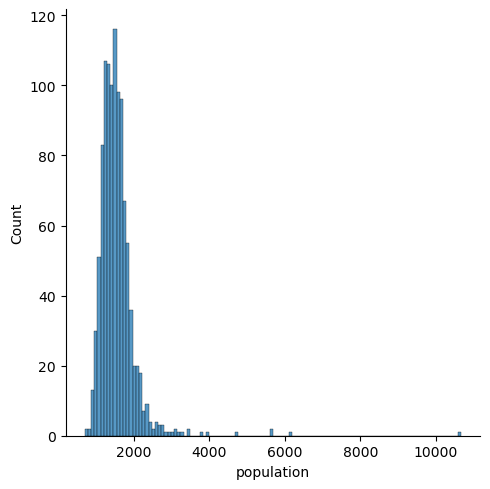

In [8]:
sns.displot(population_df["population"])

In [9]:
def std_dev(df, column, std_column=None):
    std_df = df.copy(deep=True)
    if std_column is None:
        std_column = f"{column}_std"
    
    std_df[std_column] = (
        std_df[column] - std_df[column].mean()
    ) / std_df[column].std()

    return std_df

In [10]:
def filter_extremes(df, column, max_abs_std=3):
    """filters out rows which are more than `max_abs_std` deviations away from zero."""
    std_column = f"{column}_std"
    std_df = std_dev(df, column, std_column = std_column)
    std_df = std_df[
        (std_df[std_column] >= (-1 * max_abs_std))
        & (std_df[std_column] <= max_abs_std)
    ]
    return std_df.drop(std_column, axis=1)

In [1]:
population_filtered_df = filter_extremes(population_df, column="population")
sns.displot(population_filtered_df["population"])

NameError: name 'filter_extremes' is not defined

In [12]:
def load_income_dataset(year):
    """Load income of Barcelona for a particular year, and match to census area.

    This is based on "Average gross taxable income per person (€) in the city of Barcelona based 
    on Atlas de distribución de la renta de los hogares of Instituto Nacional de Estadística (INE)"
    https://opendata-ajuntament.barcelona.cat/data/en/dataset/atles-renda-bruta-per-persona/resource/e6cabd96-68d6-451b-bc9f-c2a381d733e6

    It is assumed data is kept locally in a CSV prefixed by year.
    """
    df = pd.read_csv(f"{year}_atles_renda_bruta_persona.csv")
    df["income"] = df["Import_Renda_Bruta_€"].astype(float)
    combine_districts_and_census_areas(df, district_column='Codi_Districte',census_column='Seccio_Censal')
    
    df = df[["income","Seccio_Censal"]]
    df.set_index("Seccio_Censal")
    return df

In [13]:
income_df = load_income_dataset(2023)
income_df

,income,Seccio_Censal
0,17113.0,1001
1,13081.0,1002
2,12707.0,1003
3,16040.0,1004
4,13549.0,1005
...,...,...
1063,16307.0,10143
1064,21767.0,10234
1065,19098.0,10235
1066,19360.0,10236


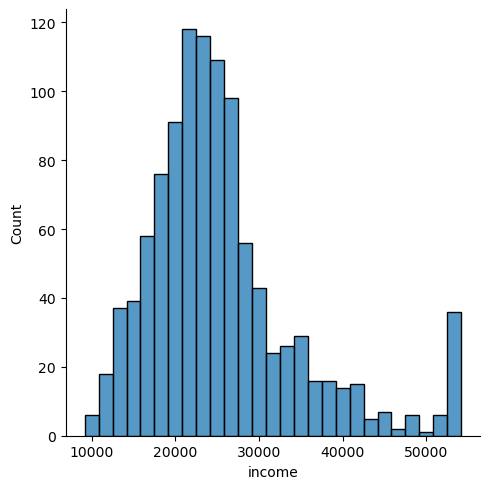

In [14]:
sns.displot(income_df["income"])

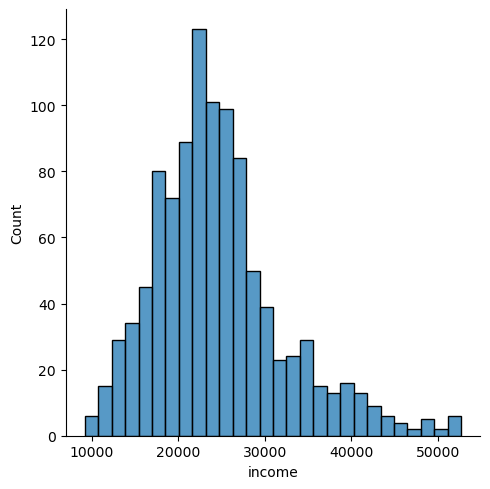

In [15]:
income_filtered_df = filter_extremes(income_df, column="income")
sns.displot(income_filtered_df["income"])

In [16]:
def merge_in_dataframes(gdf, dfs):
    """Merge multiple DataFrames into a GeoDataFrame, based on index."""
    merged_gdf = gdf
    for df in dfs:
        merged_gdf = merged_gdf.merge(df)
    return merged_gdf

In [17]:
barcelona_gdf = merge_in_dataframes(census_areas_gdf, dfs=[population_filtered_df,income_filtered_df])
barcelona_gdf

,Seccio_Censal,geometry,population,income
0,1001,"POLYGON ((2.17575 41.37827, 2.17552 41.37865, ...",1246.0,17113.0
1,1002,"POLYGON ((2.1751 41.37905, 2.1747 41.37951, 2....",1238.0,13081.0
2,1004,"POLYGON ((2.16962 41.37847, 2.16882 41.37784, ...",2881.0,16040.0
3,1005,"POLYGON ((2.17366 41.38071, 2.1733 41.38113, 2...",2294.0,13549.0
4,1006,"POLYGON ((2.1733 41.38113, 2.17316 41.38128, 2...",1579.0,14731.0
...,...,...,...,...
1016,10143,"POLYGON ((2.20926 41.42519, 2.20909 41.42534, ...",1802.0,16307.0
1017,10234,"POLYGON ((2.18971 41.40755, 2.18948 41.40759, ...",1742.0,21767.0
1018,10235,"POLYGON ((2.21303 41.41093, 2.2119 41.4118, 2....",1304.0,19098.0
1019,10236,"POLYGON ((2.21203 41.41004, 2.21079 41.41096, ...",1568.0,19360.0


In [18]:
barcelona_gdf.explore("population")

In [19]:
barcelona_gdf.explore("income")

In [20]:
import esda
import matplotlib.pyplot as plt
from libpysal import graph

def build_averaging_queen_contiguity(gdf):
    """build a Queen contiguity that is transformed to support averaging across nieghbours"""
    contiguity = graph.Graph.build_contiguity(gdf, rook=False)
    contiguity_r = contiguity.transform("r")

    return contiguity_r

def moran_global(gdf, column, crit_value=0.05):
    """Does a Global Spatial analysis using Moran's I for this dataset, and returns a plot illustrating what is happening internally."""
 
    contiguity_r = build_averaging_queen_contiguity(gdf)
    
    # do the actual analysis
    moran = esda.Moran(gdf[column], contiguity_r)
    print(f"I: {moran.I}, P_sim: {moran.p_sim}, <{crit_value}?: {moran.p_sim < crit_value}")

    # redo the analysis as a visualisation
    visualise_df = gdf.copy(deep=True)[[column]]
    lag_column = f"{column}_lag"
    visualise_df[lag_column] = contiguity_r.lag(visualise_df[column])

    f, ax = plt.subplots(1, figsize=(6, 6))
    sns.regplot(
        x=column,
        y=lag_column,
        data=visualise_df,
        marker=".",
        scatter_kws={"alpha": 0.2},
        line_kws=dict(color="lightcoral")
    )
    ax.set_aspect('equal')
    plt.axvline(0, c="black", alpha=0.5)
    plt.axhline(0, c="black", alpha=0.5)

I: 0.20797380565062412, P_sim: 0.001, <0.05?: True


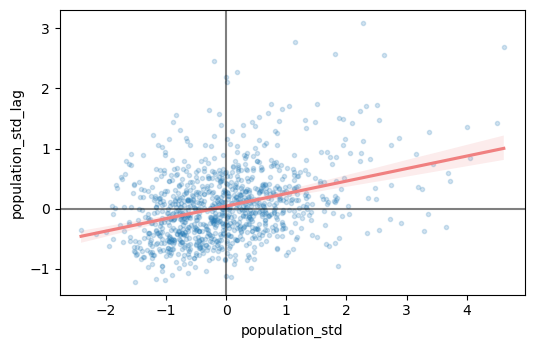

In [21]:
moran_global(std_dev(barcelona_gdf, "population"), "population_std")

In [22]:
from libpysal import graph

def moran_local_clusters(gdf, column, crit_value=0.05):
    """Does a Local Spatial analysis using LISA for this dataset, and returns an exploration of clusters."""

    contiguity_r = build_averaging_queen_contiguity(gdf)
    
    lisa_gdf = gdf.copy(deep=True)
    lisa = esda.Moran_Local(lisa_gdf[column], contiguity_r)

    lisa_gdf['cluster'] = lisa.get_cluster_labels(crit_value=crit_value)
    return lisa.explore(
        lisa_gdf,
        crit_value=crit_value,
        prefer_canvas=True,
        tiles="CartoDB Positron",
    )

In [23]:
moran_local_clusters(std_dev(barcelona_gdf, "population"), "population_std")

I: 0.8053386338527503, P_sim: 0.001, <0.05?: True


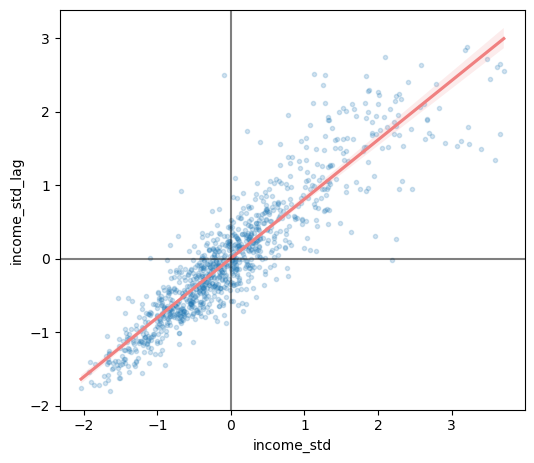

In [24]:
moran_global(std_dev(barcelona_gdf, "income"), "income_std")

In [25]:
moran_local_clusters(std_dev(barcelona_gdf, "income"), "income_std")

In [26]:
barcelona_gdf.explore()

In [34]:
import tobler
from libpysal import graph

def build_safe_grid(gdf, resolution):
    """Builds a safe H3 grid, where safe means it has no isolates.

    Some later operations don't work if we have isolates (areas with no nieghhours), so we exclude them here.
    """
    initial_grid_gdf = tobler.util.h3fy(gdf, resolution=resolution)
    
    # build a Queen contiguity and use it to exclude the isolates from the grid
    contiguity = graph.Graph.build_contiguity(initial_grid_gdf, rook=False)
    isolates = contiguity.isolates
    filtered_grid_gdf = initial_grid_gdf[~initial_grid_gdf.index.isin(isolates)]
    
    return filtered_grid_gdf

In [35]:
barcelona_grid_gdf = build_safe_grid(barcelona_gdf, resolution=9)
barcelona_grid_gdf.explore()

In [41]:
def area_interpolate(grid_gdf, data_gdf, extensive_variables, intensive_variables, projected_crs):
    assert grid_gdf.crs == data_gdf.crs
    
    original_crs = grid_gdf.crs
    
    interpolated_gdf = tobler.area_weighted.area_interpolate(
        source_df=data_gdf.to_crs(projected_crs),
        target_df=grid_gdf.to_crs(projected_crs),
        extensive_variables=extensive_variables,
        intensive_variables=intensive_variables
    )

    return interpolated_gdf.to_crs(original_crs)

In [42]:
BARCELONA_CRS = "EPSG:25831"

barcelona_interpolated_gdf = area_interpolate(
    barcelona_grid_gdf, 
    barcelona_gdf,
    extensive_variables=["population"],
    intensive_variables=["income"],
    projected_crs=BARCELONA_CRS
)

In [43]:
barcelona_interpolated_gdf

,population,income,geometry
hex_id,,,
8939446352bffff,25.649150,23931.000000,"POLYGON ((2.08326 41.42735, 2.08293 41.42913, ..."
89394460e67ffff,529.529134,26569.460092,"POLYGON ((2.19047 41.38409, 2.19015 41.38586, ..."
8939446017bffff,4431.304814,28859.630666,"POLYGON ((2.16494 41.39924, 2.16461 41.40101, ..."
89394461c07ffff,53.433619,19188.998856,"POLYGON ((2.14644 41.36516, 2.14829 41.36637, ..."
8939446022fffff,2516.663271,23482.257037,"POLYGON ((2.1398 41.37875, 2.13947 41.38053, 2..."
...,...,...,...
893944619c3ffff,6.095042,17334.000000,"POLYGON ((2.17901 41.35663, 2.17684 41.3572, 2..."
89394461827ffff,9.034293,17334.000000,"POLYGON ((2.1723 41.34823, 2.17447 41.34766, 2..."
893944619d7ffff,6.071868,17334.000000,"POLYGON ((2.17901 41.35663, 2.18085 41.35783, ..."


In [44]:
barcelona_interpolated_gdf.explore("population", tiles="CartoDB Positron")

In [45]:
barcelona_interpolated_gdf.explore("income", tiles="CartoDB Positron")

I: 0.8116826752402616, P_sim: 0.001, <0.05?: True


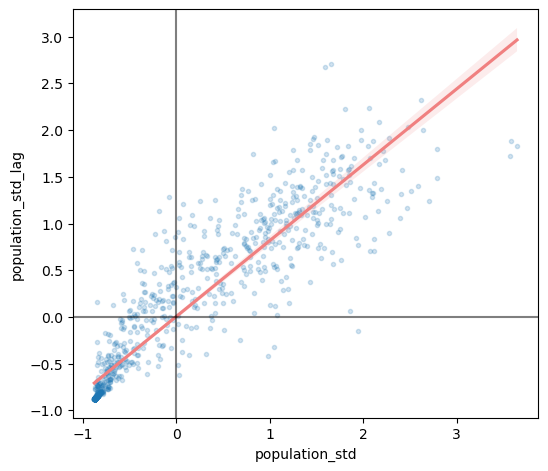

In [46]:
moran_global(std_dev(barcelona_interpolated_gdf, "population"), "population_std")

In [48]:
moran_local_clusters(std_dev(barcelona_interpolated_gdf, "population"), "population_std")

I: 0.9089526806678182, P_sim: 0.001, <0.05?: True


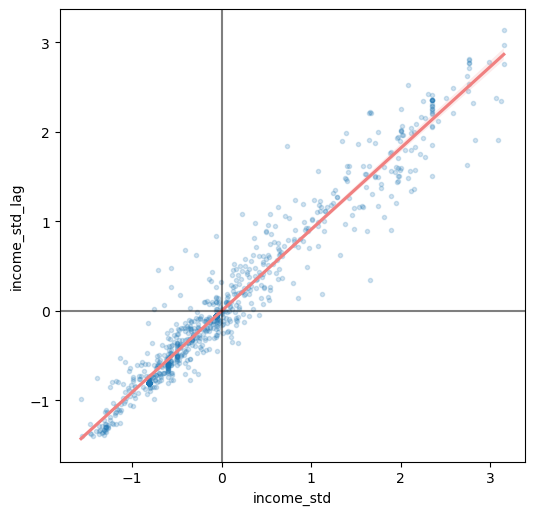

In [47]:
moran_global(std_dev(barcelona_interpolated_gdf, "income"), "income_std")

In [49]:
moran_local_clusters(std_dev(barcelona_interpolated_gdf, "income"), "income_std")